<a href="https://colab.research.google.com/github/SarahMcEliece/DTSA-5511-Deep-Learning/blob/main/Final-Bird-Classification/DTSA_5511_Deep_Learning_Final_Bird_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#DTSA 5511 Final project: BirdCLEF 2023
##Identify eastern African bird calls in soundscapes
Sarah McEliece 04/28/23

##About and Citations
The project and dataset are taken from the kaggle competetion:

Holger Klinck, Sohier Dane, Stefan Kahl, Tom Denton. (2023). BirdCLEF 2023. Kaggle. https://kaggle.com/competitions/birdclef-2023

They describe the project as:

> For this competition, you'll use your machine-learning skills to identify Eastern African bird species by sound. Specifically, you'll develop computational solutions to process continuous audio data and recognize the species by their calls. The best entries will be able to train reliable classifiers with limited training data. If successful, you'll help advance ongoing efforts to protect avian biodiversity in Africa, including those led by the Kenyan conservation organization NATURAL STATE.



My starting code and model was stemmed from the quick start notebook:

Phil Culliton & Alexis Cook. Inferring Birds with Kaggle Models. https://www.kaggle.com/code/philculliton/inferring-birds-with-kaggle-models#

#Analysis plan
I plan to create a multilabel adverserial clasiffication model using both audio from birds not included in the dataset and audio with random noise as adverserial data. This means I need to pull data for other birds other than the target dataset

# Import the data

In [ ]:
! pip install kaggle
! mkdir /content/.kaggle
! cp /kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle competitions download birdclef-2023
! unzip birdclef-2023.zip

Streaming output truncated to the last 5000 lines.
  inflating: train_audio/rerswa1/XC330427.ogg  
  inflating: train_audio/rerswa1/XC330925.ogg  
  inflating: train_audio/rerswa1/XC331732.ogg  
  inflating: train_audio/rerswa1/XC333007.ogg  
  inflating: train_audio/rerswa1/XC333008.ogg  
  inflating: train_audio/rerswa1/XC333855.ogg  
  inflating: train_audio/rerswa1/XC334159.ogg  
  inflating: train_audio/rerswa1/XC334160.ogg  
  inflating: train_audio/rerswa1/XC334161.ogg  
  inflating: train_audio/rerswa1/XC370598.ogg  
  inflating: train_audio/rerswa1/XC371021.ogg  
  inflating: train_audio/rerswa1/XC371367.ogg  
  inflating: train_audio/rerswa1/XC376096.ogg  
  inflating: train_audio/rerswa1/XC379520.ogg  
  inflating: train_audio/rerswa1/XC381917.ogg  
  inflating: train_audio/rerswa1/XC382091.ogg  
  inflating: train_audio/rerswa1/XC383377.ogg  
  inflating: train_audio/rerswa1/XC383401.ogg  
  inflating: train_audio/rerswa1/XC384434.ogg  
  inflating: train_audio/rerswa1/XC38

In [ ]:
! mkdir /content/old_data
! kaggle competitions download birdclef-2022 --force
! unzip /content/birdclef-2022.zip -d old_data/

Streaming output truncated to the last 5000 lines.
  inflating: old_data/train_audio/cangoo/XC538162.ogg  
  inflating: old_data/train_audio/cangoo/XC538165.ogg  
  inflating: old_data/train_audio/cangoo/XC538168.ogg  
  inflating: old_data/train_audio/cangoo/XC538715.ogg  
  inflating: old_data/train_audio/cangoo/XC539123.ogg  
  inflating: old_data/train_audio/cangoo/XC539846.ogg  
  inflating: old_data/train_audio/cangoo/XC541535.ogg  
  inflating: old_data/train_audio/cangoo/XC542477.ogg  
  inflating: old_data/train_audio/cangoo/XC543184.ogg  
  inflating: old_data/train_audio/cangoo/XC543318.ogg  
  inflating: old_data/train_audio/cangoo/XC543320.ogg  
  inflating: old_data/train_audio/cangoo/XC543765.ogg  
  inflating: old_data/train_audio/cangoo/XC545103.ogg  
  inflating: old_data/train_audio/cangoo/XC546401.ogg  
  inflating: old_data/train_audio/cangoo/XC547272.ogg  
  inflating: old_data/train_audio/cangoo/XC548441.ogg  
  inflating: old_data/train_audio/cangoo/XC549002.ogg

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

from tensorflow import keras

import pandas as pd
import numpy as np
import librosa
import glob

import csv
import io

from IPython.display import Audio
import random
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, LSTM, SimpleRNN
from keras.callbacks import EarlyStopping

random.seed(10)

In [ ]:
!pip install tensorflow_io
import tensorflow_io as tfio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# EDA

In [ ]:
train_meta = pd.read_csv('train_metadata.csv')
train_meta.info()

ebird = pd.read_csv('eBird_Taxonomy_v2021.csv')
ebird.info()

sample_sub = pd.read_csv('sample_submission.csv')
sample_sub.info()

adv_meta = pd.read_csv('old_data/train_metadata.csv')
adv_meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16941 entries, 0 to 16940
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   primary_label     16941 non-null  object 
 1   secondary_labels  16941 non-null  object 
 2   type              16941 non-null  object 
 3   latitude          16714 non-null  float64
 4   longitude         16714 non-null  float64
 5   scientific_name   16941 non-null  object 
 6   common_name       16941 non-null  object 
 7   author            16941 non-null  object 
 8   license           16941 non-null  object 
 9   rating            16941 non-null  float64
 10  url               16941 non-null  object 
 11  filename          16941 non-null  object 
dtypes: float64(3), object(9)
memory usage: 1.6+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16753 entries, 0 to 16752
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            ----

In [ ]:
train_meta.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,abethr1,[],['song'],4.3906,38.2788,Turdus tephronotus,African Bare-eyed Thrush,Rolf A. de By,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/128013,abethr1/XC128013.ogg
1,abethr1,[],['call'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363501,abethr1/XC363501.ogg
2,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,3.5,https://www.xeno-canto.org/363502,abethr1/XC363502.ogg
3,abethr1,[],['song'],-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/363503,abethr1/XC363503.ogg
4,abethr1,[],"['call', 'song']",-2.9524,38.2921,Turdus tephronotus,African Bare-eyed Thrush,James Bradley,Creative Commons Attribution-NonCommercial-Sha...,4.5,https://www.xeno-canto.org/363504,abethr1/XC363504.ogg


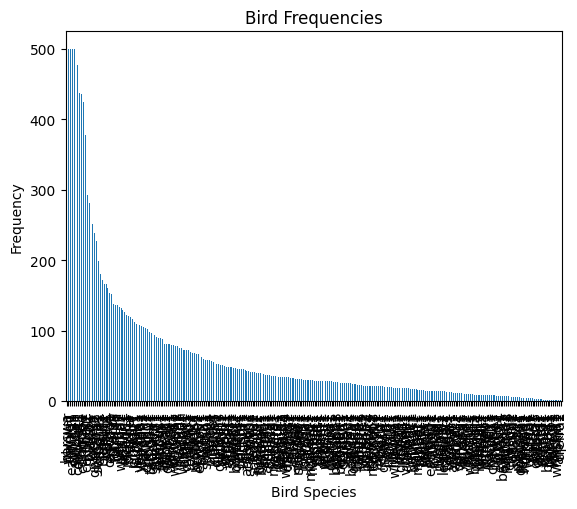

In [ ]:
import matplotlib.pyplot as plt

counts = train_meta['primary_label'].value_counts()
counts.plot(kind='bar')
plt.title('Bird Frequencies')
plt.xlabel('Bird Species')
plt.ylabel('Frequency')
plt.show()

In [ ]:
counts.describe()

count    264.000000
mean      64.170455
std       98.757285
min        1.000000
25%       14.750000
50%       29.500000
75%       70.500000
max      500.000000
Name: primary_label, dtype: float64

In [ ]:
#Preprocess the audio data
def frame_audio(
      audio_array: np.ndarray,
      window_size_s: float = 5.0,
      hop_size_s: float = 5.0,
      sample_rate = 32000,
      ) -> np.ndarray:
    
    """Helper function for framing audio for inference."""
    """ using tf.signal """
    if window_size_s is None or window_size_s < 0:
        return audio_array[np.newaxis, :]
    frame_length = int(window_size_s * sample_rate)
    hop_length = int(hop_size_s * sample_rate)
    framed_audio = tf.signal.frame(audio_array, frame_length, hop_length, pad_end=True)
    return framed_audio

def ensure_sample_rate(waveform, original_sample_rate,
                       desired_sample_rate=32000):
    """Resample waveform if required."""
    if original_sample_rate != desired_sample_rate:
        waveform = tfio.audio.resample(waveform, original_sample_rate, desired_sample_rate)
    return desired_sample_rate, waveform

# A few examples of the data
First let's listen to a Marabou stork. These are ridiculously strange birds and widely considered one of the ugliest animals on the planet.
[Image](https://justbirding.com/wp-content/uploads/2019/01/marabou-stork-facts.webp)


In [ ]:
audio, sample_rate = librosa.load("/content/train_audio/marsto1/XC137756.ogg")
sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
Audio(wav_data, rate=sample_rate)

A few things to notice. This clip is very long and contains mor ethan one bird. 

Now, let's listen to a blacksmith lapwing. It's called this because it's call sound like a blacksmith hammering metal.

In [ ]:
audio, sample_rate = librosa.load("/content/train_audio/blaplo1/XC126106.ogg")
sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
Audio(wav_data, rate=sample_rate)

This is a much shorter clip. For the kaggle competetion we are required to analyzed 5 second clips, so I will divide my data that way.

In [ ]:
#This cell import a bird labeling model that sets up a template output for the bird in the dataset
# cell script adapted from https://www.kaggle.com/code/philculliton/inferring-birds-with-kaggle-models
model = hub.load('https://kaggle.com/models/google/bird-vocalization-classifier/frameworks/tensorFlow2/variations/bird-vocalization-classifier/versions/1')
labels_path = hub.resolve('https://kaggle.com/models/google/bird-vocalization-classifier/frameworks/tensorFlow2/variations/bird-vocalization-classifier/versions/1') + "/assets/label.csv"

# Find the name of the class with the top score when mean-aggregated across frames.
def class_names_from_csv(class_map_csv_text):
    """Returns list of class names corresponding to score vector."""
    with open(labels_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        class_names = [mid for mid, desc in csv_reader]
        return class_names[1:]

## note that the bird classifier classifies a much larger set of birds than the
## competition, so we need to load the model's set of class names or else our 
## indices will be off.
classes = class_names_from_csv(labels_path)
competition_classes = sorted(train_meta.primary_label.unique())

forced_defaults = 0
competition_class_map = []
for c in competition_classes:
    try:
        i = classes.index(c)
        competition_class_map.append(i)
    except:
        competition_class_map.append(0)
        forced_defaults += 1
        
## this is the count of classes not supported by our pretrained model
## you could choose to simply not predict these, set a default as above,
## or create your own model using the pretrained model as a base.
forced_defaults

3

In [ ]:
print("number of species: ", len(competition_classes))

number of species:  264


In [ ]:
#initialize a results array to hold trainng labels
#I'm going to make the primary label 1 and secondary labels .9
train_classes = np.zeros([len(train_meta),len(competition_classes)])

for i in range(len(train_meta)):
  primary_i = competition_classes.index(train_meta['primary_label'][i])
  train_classes[i,primary_i] = 1
  second = eval(train_meta['secondary_labels'][i])

  for ii in second:
    if len(ii)>0:
      secondary_i = competition_classes.index(ii)
      train_classes[i,secondary_i] = .9

In [ ]:
##I'm also creating a results array for my adverserial data
adv_classes = np.zeros([len(adv_meta),len(competition_classes)])

for i in range(len(adv_meta)):
  if i in competition_classes:
    primary_i = competition_classes.index(adv_meta['primary_label'][i])
    train_classes[i,primary_i] = 1
  second = eval(adv_meta['secondary_labels'][i])

  for ii in second:
    if len(ii)>0 and ii in competition_classes:
      secondary_i = competition_classes.index(ii)
      adv_classes[i,secondary_i] = .9

In [ ]:
np.sum(adv_classes)

9.9

#Processing the audio data
This section is a mess because it endlessly crashed on me

In [ ]:
# train_audio_clips = []
# train_labels = []
# for i in range(len(train_meta)):
#   audio, sample_rate =  librosa.load('/content/train_audio/'+train_meta['filename'][i])
#   sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
#   fixed_tm = frame_audio(wav_data)

#   for ii in fixed_tm:
#     # Extract the features from the audio signal
#     features = librosa.feature.melspectrogram(y=ii.numpy(), sr=sample_rate)
#     # Normalize the features
#     features -= np.mean(features)
#     features /= np.std(features)
#     # Reshape the features to add a channel dimension for use in a CNN
#     features = features.reshape((features.shape[0], features.shape[1], 1))
#     train_audio_clips.append(features)

#     train_labels.append(train_classes[i])

In [ ]:
#np.save("proccessed_audio_train.npy", train_audio_clips, allow_pickle=True, fix_imports=True)

In [ ]:
#np.save("proccessed_label_train.npy", train_labels, allow_pickle=True, fix_imports=True)

In [ ]:
train_audio_clips = np.load('proccessed_audio_train.npy', mmap_mode=None, allow_pickle=True)
train_labels = np.load('proccessed_label_train.npy', mmap_mode=None, allow_pickle=True)

In [ ]:
len(adv_idx)

2970

In [ ]:
# #For efficiency, I'm not going to use all of the old data as adverserial data
# adv_audio_clips = []
# adv_labels = []

# adv_idx = random.sample(range(len(adv_meta)), round(len(adv_meta)*0.2))


# for i in adv_idx:
#   audio, sample_rate =  librosa.load('/content/old_data/train_audio/'+adv_meta['filename'][i])
#   sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
#   fixed_tm = frame_audio(wav_data)

#   for ii in fixed_tm:
#     # Extract the features from the audio signal
#     features = librosa.feature.melspectrogram(y=ii.numpy(), sr=sample_rate)
#     # Normalize the features
#     features -= np.mean(features)
#     features /= np.std(features)
#     # Reshape the features to add a channel dimension for use in a CNN
#     features = features.reshape((features.shape[0], features.shape[1], 1))
#     adv_audio_clips.append(features)
#     adv_labels.append(adv_classes[i])

In [ ]:
# np.save("adv_train.npy", adv_audio_clips, allow_pickle=True, fix_imports=True)
# np.save("adv_labels.npy", adv_labels, allow_pickle=True, fix_imports=True)

In [ ]:
adv_audio_clips = np.load('adv_train.npy', mmap_mode=None, allow_pickle=True)
adv_labels = np.load('adv_labels.npy', mmap_mode=None, allow_pickle=True)

In [ ]:
#I'm also going to take some of my labeled data and add random noise
def add_noise(data, noise_factor=0.05):
    noise = np.random.randn(*data.shape)
    augmented_data = data + noise_factor * noise
    augmented_data = np.clip(augmented_data, -1, 1)
    return augmented_data

noise_idx = random.sample(range(len(adv_meta)), round(len(adv_meta)*.20))

# Add random noise to the selected samples
for i in noise_idx[:5]:
    adv_audio_clips = np.append(adv_audio_clips, add_noise(train_audio_clips[i]).reshape(1,128,313,1),axis=0)
    adv_labels = np.append(adv_labels, train_labels[i].reshape(1,264),axis=0)


In [ ]:
#all_clips = np.append(train_audio_clips,adv_audio_clips,axis=0)
#all_labels = np.append(train_labels,adv_labels,axis=0)

In [ ]:
from google.colab import files
#files.download('proccessed_clips.npy')
#files.download('proccessed_labels.npy')

In [ ]:
!zip -r /content/model2.zip /content/model2
files.download('/content/model2.zip')

  adding: content/model2/ (stored 0%)
  adding: content/model2/fingerprint.pb (stored 0%)
  adding: content/model2/variables/ (stored 0%)
  adding: content/model2/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: content/model2/variables/variables.index (deflated 67%)
  adding: content/model2/saved_model.pb (deflated 88%)
  adding: content/model2/assets/ (stored 0%)
  adding: content/model2/keras_metadata.pb (deflated 92%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#np.save("proccessed_clips.npy", all_clips, allow_pickle=True, fix_imports=True)
#np.save("proccessed_labels.npy", all_labels, allow_pickle=True, fix_imports=True)
all_clips = np.load('proccessed_clips.npy', mmap_mode=None, allow_pickle=True)
all_labels = np.load('proccessed_labels.npy', mmap_mode=None, allow_pickle=True)

In [ ]:
print("Input shape:", train_audio_clips[1].shape)

# Building and training models

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from keras.callbacks import EarlyStopping

# Define the model
model = Sequential([
  # Add convolutional layers
  Conv2D(32, (3, 3), activation='relu', input_shape=(128, 313, 1)),
  Conv2D(32, (3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.25),

  Conv2D(64, (3, 3), activation='relu'),
  Conv2D(64, (3, 3), activation='relu'),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.25),

  # Flatten the output
  Flatten(),

  # Add dense layers
  Dense(512, activation='relu'),
  Dropout(0.5),
  Dense(264, activation='sigmoid')
])

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [ ]:
batch_size = 150
history = model.fit(
        all_clips, all_labels,
        steps_per_epoch=round(len(all_labels)*.67) // batch_size,
        validation_split=0.33,
        epochs=15,
        callbacks=[early_stopping])

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


I stopped this model early because it overfit immediately. Adding more regularization.

# Model 2

<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7f62500c55d0>>
Epoch 1/15
500/500 [==============================] - ETA: 0s - loss: 0.0809 - accuracy: 0.1164

500/500 [==============================] - 139s 197ms/step - loss: 0.0809 - accuracy: 0.1164 - val_loss: 0.0301 - val_accuracy: 4.8818e-04
Epoch 2/15
499/500 [============================>.] - ETA: 0s - loss: 0.0287 - accuracy: 0.1727

500/500 [==============================] - 75s 150ms/step - loss: 0.0287 - accuracy: 0.1727
Epoch 3/15
499/500 [============================>.] - ETA: 0s - loss: 0.0265 - accuracy: 0.1825

500/500 [==============================] - 75s 150ms/step - loss: 0.0265 - accuracy: 0.1825
Epoch 4/15
499/500 [============================>.] - ETA: 0s - loss: 0.0255 - accuracy: 0.1956

500/500 [==============================] - 75s 150ms/step - loss: 0.0255 - accuracy: 0.1956
Epoch 5/15
499/500 [============================>.] - ETA: 0s - loss: 0.0247 - accuracy: 0.2106

500/500 [==============================] - 75s 150ms/step - loss: 0.0247 - accuracy: 0.2106
Epoch 6/15
499/500 [============================>.] - ETA: 0s - loss: 0.0239 - accuracy: 0.2263

500/500 [==============================] - 75s 150ms/step - loss: 0.0239 - accuracy: 0.2263
Epoch 7/15
499/500 [============================>.] - ETA: 0s - loss: 0.0230 - accuracy: 0.2451

500/500 [==============================] - 75s 150ms/step - loss: 0.0230 - accuracy: 0.2451
Epoch 8/15
499/500 [============================>.] - ETA: 0s - loss: 0.0221 - accuracy: 0.2676

500/500 [==============================] - 75s 150ms/step - loss: 0.0221 - accuracy: 0.2676
Epoch 9/15
499/500 [============================>.] - ETA: 0s - loss: 0.0210 - accuracy: 0.2922

500/500 [==============================] - 75s 150ms/step - loss: 0.0210 - accuracy: 0.2922
Epoch 10/15
499/500 [============================>.] - ETA: 0s - loss: 0.0199 - accuracy: 0.3227

500/500 [==============================] - 75s 151ms/step - loss: 0.0199 - accuracy: 0.3227
Epoch 11/15
499/500 [============================>.] - ETA: 0s - loss: 0.0187 - accuracy: 0.3573

500/500 [==============================] - 75s 150ms/step - loss: 0.0187 - accuracy: 0.3573
Epoch 12/15
499/500 [============================>.] - ETA: 0s - loss: 0.0177 - accuracy: 0.3899

500/500 [==============================] - 75s 150ms/step - loss: 0.0177 - accuracy: 0.3899
Epoch 13/15
499/500 [============================>.] - ETA: 0s - loss: 0.0166 - accuracy: 0.4319

500/500 [==============================] - 75s 150ms/step - loss: 0.0166 - accuracy: 0.4319
Epoch 14/15
499/500 [============================>.] - ETA: 0s - loss: 0.0156 - accuracy: 0.4676

500/500 [==============================] - 75s 150ms/step - loss: 0.0156 - accuracy: 0.4676
Epoch 15/15
499/500 [============================>.] - ETA: 0s - loss: 0.0146 - accuracy: 0.5009

500/500 [==============================] - 75s 150ms/step - loss: 0.0146 - accuracy: 0.5009


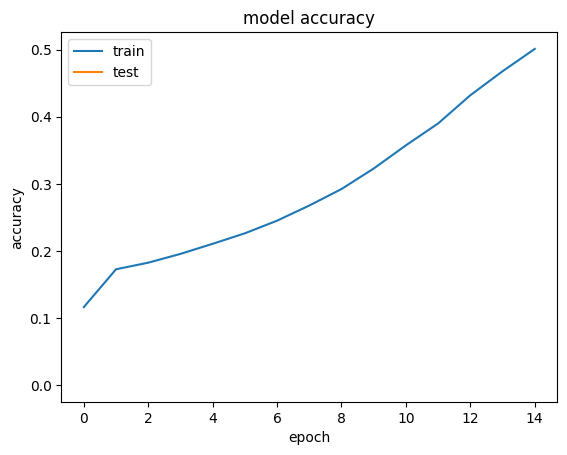

In [ ]:
# Addin more reularization- normalization layers and higher dropout
model2 = Sequential([
  # Add convolutional layers
  Conv2D(32, (3, 3), activation='relu', input_shape=(128, 313, 1)),
  Conv2D(64, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.5),

  Conv2D(64, (3, 3), activation='relu'),
  Conv2D(128, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  # Flatten the output
  Flatten(),

  # Add dense layers
  Dense(512, activation='relu'),
  Dropout(0.5),
  Dense(264, activation='sigmoid')
])
print(model2.summary)
model2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.BinaryCrossentropy(), 
              metrics=['accuracy'])

early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

batch_size = 100

history2 = model2.fit(
        all_clips, all_labels,
        steps_per_epoch=500,
        validation_split=0.33,
        epochs=15,
        validation_steps=250,
        callbacks=[early_stopping])

#Let's graph this mess
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
model2.save('model2')
!zip -r /content/model2.zip /content/model2
files.download('/content/model2.zip')

# Model 3

In [ ]:
# Addin more reularization- normalization layers and higher dropout
model3 = Sequential([
  # Add convolutional layers
  Conv2D(32, (3, 3), activation='relu', input_shape=(128, 313, 1)),
  Conv2D(32, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.5),

  Conv2D(64, (3, 3), activation='relu'),
  Conv2D(64, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  Conv2D(128, (3, 3), activation='relu'),
  Conv2D(128, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  # Flatten the output
  Flatten(),

  # Add dense layers
  Dense(512, activation='relu'),
  Dropout(0.5),
  Dense(264, activation='sigmoid')
])

print(model3.summary)

model3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.BinaryCrossentropy(), 
              metrics=['accuracy'])

early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

batch_size = 100

history3 = model3.fit(
        all_clips, all_labels,
        steps_per_epoch=500,
        validation_split=0.33,
        epochs=30,
        callbacks=[early_stopping])

model3.save('model3')
!zip -r /content/model3.zip /content/model3


#Let's graph this mess
plt.plot(history3.history['accuracy'])
plt.plot(history3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7efc20141150>>
Epoch 1/30
500/500 [==============================] - 114s 162ms/step - loss: 0.0524 - accuracy: 0.1266 - val_loss: 0.0325 - val_accuracy: 1.6273e-04
Epoch 2/30
500/500 [==============================] - 69s 137ms/step - loss: 0.0252 - accuracy: 0.1998 - val_loss: 0.0804 - val_accuracy: 4.6493e-05
Epoch 3/30
500/500 [==============================] - 69s 137ms/step - loss: 0.0232 - accuracy: 0.2317 - val_loss: 0.0223 - val_accuracy: 1.1623e-04
Epoch 4/30
500/500 [==============================] - 69s 138ms/step - loss: 0.0220 - accuracy: 0.2669 - val_loss: 0.0180 - val_accuracy: 2.3247e-04
Epoch 5/30
500/500 [==============================] - 69s 138ms/step - loss: 0.0210 - accuracy: 0.3007 - val_loss: 0.0170 - val_accuracy: 0.0032
Epoch 6/30
500/500 [==============================] - 69s 138ms/step - loss: 0.0208 - accuracy: 0.3243 - val_loss: 0.0179 - val_accuracy: 0.0019
Epoch 7/30
500/500 

  adding: content/model3/ (stored 0%)
  adding: content/model3/fingerprint.pb (stored 0%)
  adding: content/model3/variables/ (stored 0%)
  adding: content/model3/variables/variables.data-00000-of-00001 (deflated 6%)
  adding: content/model3/variables/variables.index (deflated 69%)
  adding: content/model3/saved_model.pb (deflated 89%)
  adding: content/model3/assets/ (stored 0%)
  adding: content/model3/keras_metadata.pb (deflated 93%)


NameError: ignored

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

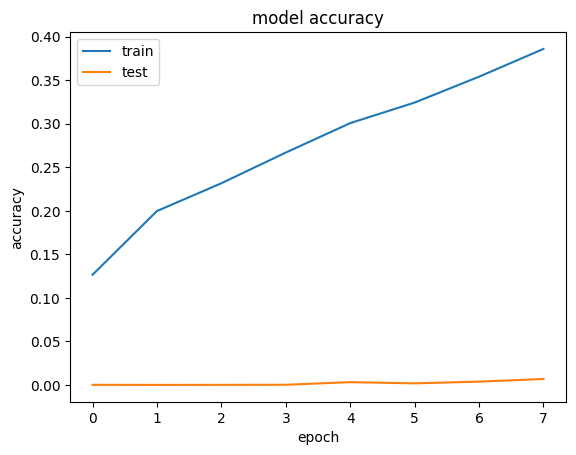

In [ ]:
files.download('/content/model3.zip')

#Let's graph this mess
plt.plot(history3.history['accuracy'])
plt.plot(history3.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Model 4

<bound method Model.summary of <keras.engine.sequential.Sequential object at 0x7f2781b71e70>>
Epoch 1/30
500/500 [==============================] - 119s 167ms/step - loss: 0.0443 - accuracy: 0.1310 - val_loss: 0.0175 - val_accuracy: 4.6493e-05
Epoch 2/30
500/500 [==============================] - 71s 142ms/step - loss: 0.0235 - accuracy: 0.2081 - val_loss: 0.0228 - val_accuracy: 0.0040
Epoch 3/30
500/500 [==============================] - 71s 142ms/step - loss: 0.0223 - accuracy: 0.2318 - val_loss: 0.0188 - val_accuracy: 6.9740e-05
Epoch 4/30
500/500 [==============================] - 71s 142ms/step - loss: 0.0214 - accuracy: 0.2592 - val_loss: 0.0233 - val_accuracy: 0.0029


  adding: content/model4/ (stored 0%)
  adding: content/model4/fingerprint.pb (stored 0%)
  adding: content/model4/variables/ (stored 0%)
  adding: content/model4/variables/variables.data-00000-of-00001 (deflated 7%)
  adding: content/model4/variables/variables.index (deflated 71%)
  adding: content/model4/saved_model.pb (deflated 89%)
  adding: content/model4/assets/ (stored 0%)
  adding: content/model4/keras_metadata.pb (deflated 94%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

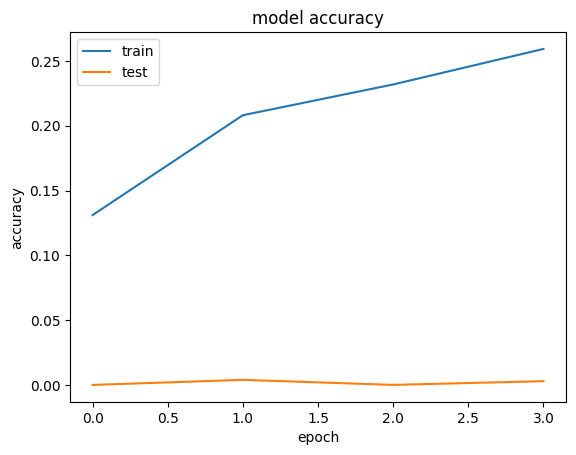

In [ ]:
# Addin more reularization- normalization layers and higher dropout
model4 = Sequential([
  # Add convolutional layers
  Conv2D(32, (3, 3), activation='relu', input_shape=(128, 313, 1)),
  Conv2D(32, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.8),

  Conv2D(64, (3, 3), activation='relu'),
  Conv2D(64, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  Conv2D(128, (3, 3), activation='relu'),
  Conv2D(128, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  Conv2D(256, (3, 3), activation='relu'),
  Conv2D(256, (3, 3), activation='relu'),
  BatchNormalization(),
  MaxPooling2D(pool_size=(2, 2)),
  Dropout(0.75),

  # Flatten the output
  Flatten(),

  # Add dense layers
  Dense(512, activation='relu'),
  Dropout(0.5),
  Dense(264, activation='sigmoid')
])

print(model4.summary)

model4.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.BinaryCrossentropy(), 
              metrics=['accuracy'])

early_stopping = EarlyStopping(patience=3, restore_best_weights=True)

batch_size = 100

history4 = model4.fit(
        all_clips, all_labels,
        steps_per_epoch=500,
        validation_split=0.33,
        epochs=30,
        callbacks=[early_stopping])

model4.save('model4')
!zip -r /content/model4.zip /content/model4
files.download('/content/model4.zip')

#Let's graph this mess
plt.plot(history4.history['accuracy'])
plt.plot(history4.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

Well, I'm out of time and my validation accuracy is still non-existent.

# Write up and Summary
The final submission is generated in the kaggle notebook: https://www.kaggle.com/code/sarahmceliece/dtsa-5511-final-project-birdclef-2023

This project really didn't turn out. I had a ton of issues getting my model to work with audio files, and working with such a big dataset was a mistake. It used a ton of resources and I had to upgrade to Colab pro to just get the dumb thing to run. Then I ran out of time for model training before I was able to resolve vital issues in my model/project. 

What I would have liked to done is spend mroe time building th eadverserial dataset, that way I could train a legitimate model. Train on smaller samples and incorporate location data. Use the entire audio clips for training and create an RNN which I just couldn't figure out with my audio data. At the end of the day, my issues started way before I actually trained my model and this was a bit to ambitious for the time I had alloted. 